# Integrating all sc data for colons
##### Runs on stenv3

In [1]:
# imports libraries 
import os
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
from harmony import harmonize

Load definitions

In [2]:
def get_cluster_proportions(adata,
                            cluster_key="cluster_final",
                            sample_key="replicate",
                            drop_values=None):
    """
    Input
    =====
    adata : AnnData object
    cluster_key : key of `adata.obs` storing cluster info
    sample_key : key of `adata.obs` storing sample/replicate info
    drop_values : list/iterable of possible values of `sample_key` that you don't want
    
    Returns
    =======
    pd.DataFrame with samples as the index and clusters as the columns and 0-100 floats
    as values
    """
    
    adata_tmp = adata.copy()
    sizes = adata_tmp.obs.groupby([cluster_key, sample_key]).size()
    props = sizes.groupby(level=1).apply(lambda x: 100 * x / x.sum()).reset_index() 
    props = props.pivot(columns=sample_key, index=cluster_key).T
    props.index = props.index.droplevel(0)
    props.fillna(0, inplace=True)
    
    if drop_values is not None:
        for drop_value in drop_values:
            props.drop(drop_value, axis=0, inplace=True)
    return props


def plot_cluster_proportions(cluster_props, 
                             cluster_palette=None,
                             xlabel_rotation=0,
                             order = None): 
    fig, ax = plt.subplots(dpi=300)
    fig.patch.set_facecolor("white")
    
    cmap = None
    if cluster_palette is not None:
        cmap = sns.palettes.blend_palette(
            cluster_palette, 
            n_colors=len(cluster_palette), 
            as_cmap=True)
   
    cluster_props = cluster_props.reindex(order)

    cluster_props.plot(
        kind="bar", 
        stacked=True, 
        ax=ax, 
        legend=None, 
        colormap=cmap
    )
    
    ax.legend(bbox_to_anchor=(1.01, 1), frameon=False, title="Cluster")
    sns.despine(fig, ax)
    ax.tick_params(axis="x", rotation=xlabel_rotation)
    ax.set_xlabel(cluster_props.index.name.capitalize())
    ax.set_ylabel("Proportion")
    fig.tight_layout()
    
    return fig


In [3]:
# error settings to avoid crowding the notebook
sc.settings.verbosity = 0             
sc.settings.set_figure_params(dpi=80, facecolor='white')

Read in both datasets

In [4]:
ref = sc.read_h5ad('/home/svickovi/data/sc_anndatas/adata_colons_dev_after_tsne_12w_k25_after_renaming.h5ad')

In [5]:
ref.obs['10x_version'] = 'v2'
ref.obs['Region'] = 'All'

In [6]:
ref.obs['Sample_ID'] = ["S"+str(int(i.split("S")[1])+23) for i in ref.obs['Unique_ID']]

In [7]:
ref.obs['Unique_ID'] = [i+"_"+j for i,j in zip(ref.obs['Mouse_ID'], ref.obs['Unique_ID'])]

In [8]:
adata_c = sc.read_h5ad('/home/svickovi/data/sc_anndatas/adata_colons_dev_without12w.h5ad')

Start dataset merging

In [9]:
# makes sure both datasets have the same gene subsets
var_names = adata_c.var_names.intersection(ref.var_names)
adata_c_subset = adata_c[:, var_names]
ref_subset = ref[:, var_names]

In [11]:
adata_c_integ = ref_subset.concatenate(adata_c_subset)

### Merge datasets using scVi

In [10]:
import scvi

In [40]:
labels = np.repeat("Unknown", adata_c_integ.shape[0])
labels = labels.astype("<U43")
for x in np.unique([str(i) for i in adata_c_integ.obs.leiden_cell_types.astype('category')]):
    idx = np.where((adata_c_integ.obs.leiden_cell_types == x) & (adata_c_integ.obs["batch"] == '0'))[
        0
    ]
    sampled = np.random.choice(idx, np.min([100, len(idx)]))
    labels[sampled] = adata_c_integ.obs.leiden_cell_types[sampled]

adata_c_integ.obs["celltype_scanvi"] = labels

In [42]:
scvi.data.setup_anndata(
    adata_c_integ,
    batch_key="batch",
    labels_key="celltype_scanvi",
)

INFO     Using batches from adata.obs["batch"]                                               
INFO     Using labels from adata.obs["celltype_scanvi"]                                      
INFO     Using data from adata.X                                                             
INFO     Computing library size prior per batch                                              


/home/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/scvi/data/_anndata.py:795: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  logger_data_loc


WARNING  This dataset has some empty cells, this might fail inference.Data should be filtered
         with `scanpy.pp.filter_cells()`                                                     
WARNING  This dataset has some empty cells, this might fail inference.Data should be filtered
         with `scanpy.pp.filter_cells()`                                                     
INFO     Successfully registered anndata object containing 399542 cells, 2077 vars, 2        
         batches, 30 labels, and 0 proteins. Also registered 0 extra categorical covariates  
         and 0 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


In [44]:
lvae = scvi.model.SCANVI(adata_c_integ, "Unknown", use_cuda=True, n_latent=30, n_layers=2)

WARNING  Make sure the registered X field in anndata contains unnormalized count data.       


/home/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/torch/cuda/__init__.py:52: UserWarning: CUDA initialization: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx (Triggered internally at  /pytorch/c10/cuda/CUDAFunctions.cpp:100.)
  return torch._C._cuda_getDeviceCount() > 0


### Merge datasets using ingest

In [53]:
sc.tl.ingest(adata_c_subset, ref_subset, obs=['leiden'])

In [54]:
adata_c_subset

AnnData object with n_obs × n_vars = 71436 × 2077
    obs: 'age', 'Unique_ID', 'Mouse_ID', 'Sample_ID', '10x_version', 'Region', 'batch', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_Gm', 'log1p_total_counts_Gm', 'pct_counts_Gm', 'doublet_scores', 'predicted_doublets', 'S_score', 'G2M_score', 'phase', 'leiden', '__is_in_cluster__'
    var: 'gene_ids', 'feature_types', 'n_cells', 'Gm', 'ribo', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mean', 'std'
    uns: 'age_colors', "dendrogram_['leiden']", 'leiden', 'leiden_colors', 'leiden_sizes', 'neighbors', 'paga', 'pca', 'umap'
    obsm: 'X_harmony', 'X_pca', 'X_umap', 'rep'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
'Cleans up colors and obs'
adata_c_subset.uns['leiden_cell_types_colors'] = ref_subset.uns['leiden_cell_types_colors']  # fix colors
adata_c_integ = ref_subset.concatenate(adata_c_subset, batch_categories=['12w', 'new']) #, batch_categories=['12w', 'new']
adata_c_integ.obs.leiden_cell_types = adata_c_integ.obs.leiden_cell_types.astype('category')
adata_c_integ.obs.leiden_cell_types.cat.reorder_categories(ref_subset.obs.leiden_cell_types.cat.categories, inplace=True)  # fix category ordering
adata_c_integ.uns['leiden_cell_types_colors'] = ref_subset.uns['leiden_cell_types_colors']  # fix category colors

'Cleans up colors and obs'
adata_c_subset.uns['leiden_cell_types_colors'] = ref_subset.uns['leiden_cell_types_colors']  # fix colors
adata_c_integ = ref_subset.concatenate(adata_c_subset, batch_categories=['12w', 'new']) #, batch_categories=['12w', 'new']
adata_c_integ.obs.leiden = adata_c_integ.obs.leiden.astype('category')
adata_c_integ.obs.leiden.cat.reorder_categories(ref_subset.obs.leiden.cat.categories, inplace=True)  # fix category ordering
adata_c_integ.uns['leiden'] = ref_subset.uns['leiden']  # fix category colors

In [70]:
adata_c_integ.obs.leiden

M1_S1.AGTAGCTAGCCTGCCA-12w      Fibroblast
M1_S1.CTGTGAATCAAGCCTA-12w            TA_2
M1_S1.TGCTTGCTCGACACCG-12w            Glia
M1_S1.TTCAATCTCATGTCTT-12w    Cycling_TA_2
M1_S1.AGTCACATCTCCTGAC-12w            TA_1
                                  ...     
TTGCGTCTCATAACCG-1-22-new              NaN
TTGGCAATCTCGGACG-1-22-new              NaN
TTGTAGGAGCGGATCA-1-22-new              NaN
TTTCCTCGTTACGTCA-1-22-new              NaN
TTTGTCAAGGAATCGC-1-22-new              NaN
Name: leiden, Length: 399542, dtype: category
Categories (29, object): ['B_cell', 'Colonocyte_1', 'Colonocyte_2', 'Cycling_TA_1', ..., 'TA_7', 'T_cell', 'Tuft', 'Vascular']

In [57]:
#adata_c_integ.write_h5ad("adata_c_integ.h5ad")

env: PYTHONHASHSEED=0


... storing 'Unique_ID' as categorical
... storing 'Sample_ID' as categorical
... storing 'Mouse_ID' as categorical
... storing 'Sex' as categorical
... storing 'cell_type' as categorical
... storing 'age' as categorical
... storing 'pheno' as categorical
... storing 'pheno_cell_types' as categorical
... storing '10x_version' as categorical
... storing 'Region' as categorical
... storing '__is_in_cluster__' as categorical


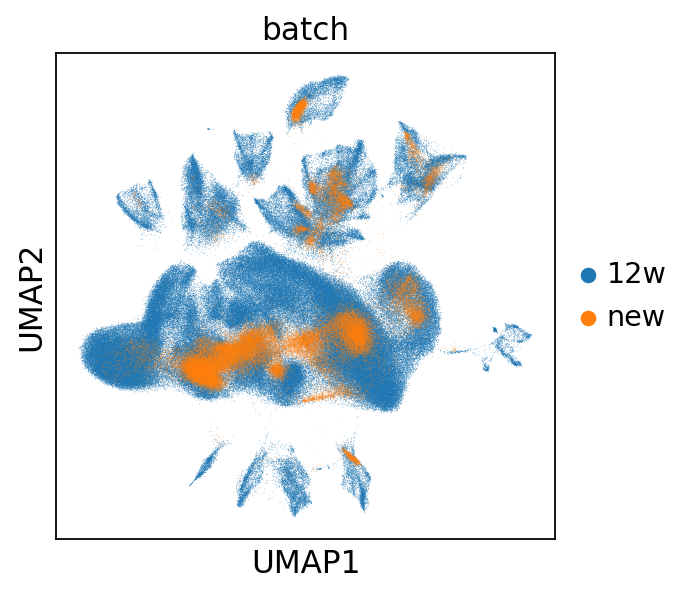

In [58]:
%env PYTHONHASHSEED=0
sc.tl.pca(adata_c_integ, svd_solver='arpack')
sc.pp.neighbors(adata_c_integ, n_neighbors=20, n_pcs=40)
# Sanity check before harmony
sc.pl.umap(adata_c_integ, color=['batch',])

In [64]:
adata_c_integ.obs.leiden

M1_S1.AGTAGCTAGCCTGCCA-12w    12
M1_S1.CTGTGAATCAAGCCTA-12w     3
M1_S1.TGCTTGCTCGACACCG-12w    16
M1_S1.TTCAATCTCATGTCTT-12w     9
M1_S1.AGTCACATCTCCTGAC-12w     0
                              ..
TTGCGTCTCATAACCG-1-22-new      1
TTGGCAATCTCGGACG-1-22-new      1
TTGTAGGAGCGGATCA-1-22-new     13
TTTCCTCGTTACGTCA-1-22-new     13
TTTGTCAAGGAATCGC-1-22-new     13
Name: leiden, Length: 399542, dtype: int64

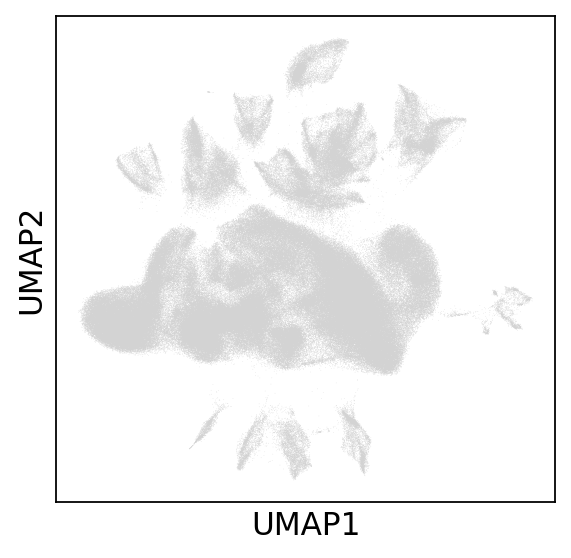

In [62]:
sc.pl.umap(adata_c_integ,)

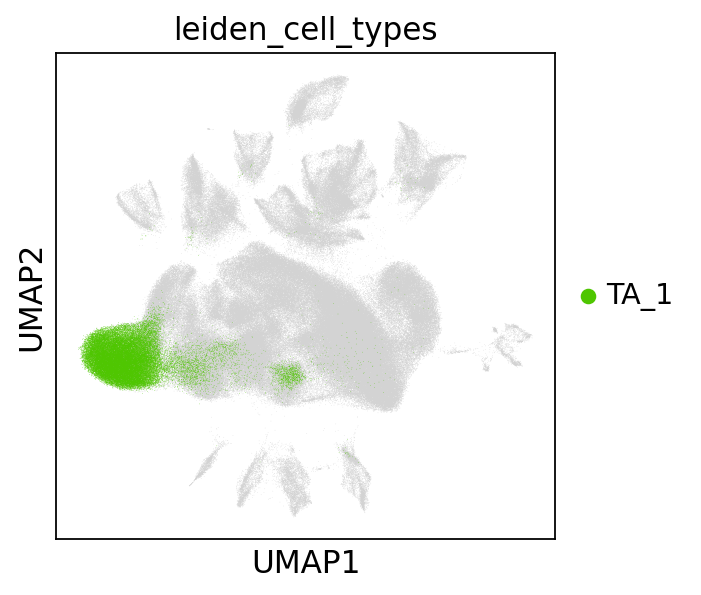

In [45]:
sc.pl.umap(adata_c_integ, color=['leiden_cell_types',], groups = ['TA_1'])

In [ ]:
sc.pl.umap(adata_c_integ, color=['leiden_cell_types',], groups = ['Cycling_TA_1'])

In [26]:
'Use harmony to correct for difference between animals'
adata_c_integ.obsm['X_harmony'] = harmonize(np.array(adata_c_integ.obsm['X_pca']), adata_c_integ.obs, batch_key = ['batch'])
sc.pp.neighbors(adata_c_integ, use_rep='X_harmony', n_neighbors=20, n_pcs=40)
sc.tl.umap(adata_c_integ)

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
Reach convergence after 6 iteration(s).


In [32]:
adata_c_integ.obs

,leiden,Unique_ID,Sample_ID,Mouse_ID,Sex,cell_type,age,predicted_doublets,n_genes,n_genes_by_counts,...,G2M_score,phase,pheno,pheno_cell_types,leiden_cell_types,10x_version,Region,batch,doublet_scores,leiden_cell_types2
M1_S1.AGTAGCTAGCCTGCCA-12w,12,S24,M1_S24,M1,F,Fibroblast,12w,False,1229,1229,...,-0.035925,G1,13,Fibroblast,Fibroblast,v2,All,12w,NaN,nan
M1_S1.CTGTGAATCAAGCCTA-12w,3,S24,M1_S24,M1,F,TA_2,12w,False,1159,1159,...,-0.026417,G1,0,Stem_1,TA_2,v2,All,12w,NaN,nan
M1_S1.TGCTTGCTCGACACCG-12w,16,S24,M1_S24,M1,F,Glia,12w,False,2099,2099,...,-0.094589,G1,16,Glia,Glia,v2,All,12w,NaN,nan
M1_S1.TTCAATCTCATGTCTT-12w,9,S24,M1_S24,M1,F,Cycling_TA_2,12w,False,1651,1651,...,0.061769,S,12,Cycling_TA_2,Cycling_TA_2,v2,All,12w,NaN,nan
M1_S1.AGTCACATCTCCTGAC-12w,0,S24,M1_S24,M1,F,TA_1,12w,False,1577,1577,...,-0.084108,G1,1,TA_1,TA_1,v2,All,12w,NaN,nan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGCGTCTCATAACCG-1-22-new,0,S14_M4,S14,M4,nan,nan,4w,False,704,703,...,0.088481,G2M,nan,nan,TA_1,v2,Proximal,new,0.007212,TA_1
TTGGCAATCTCGGACG-1-22-new,0,S14_M4,S14,M4,nan,nan,4w,False,764,763,...,-0.078451,G1,nan,nan,TA_1,v2,Proximal,new,0.012912,TA_1
TTGTAGGAGCGGATCA-1-22-new,5,S14_M4,S14,M4,nan,nan,4w,False,872,871,...,0.174392,G2M,nan,nan,Stem_1,v2,Proximal,new,0.050331,Stem_1
TTTCCTCGTTACGTCA-1-22-new,0,S14_M4,S14,M4,nan,nan,4w,False,857,853,...,-0.030736,G1,nan,nan,TA_1,v2,Proximal,new,0.099711,TA_1


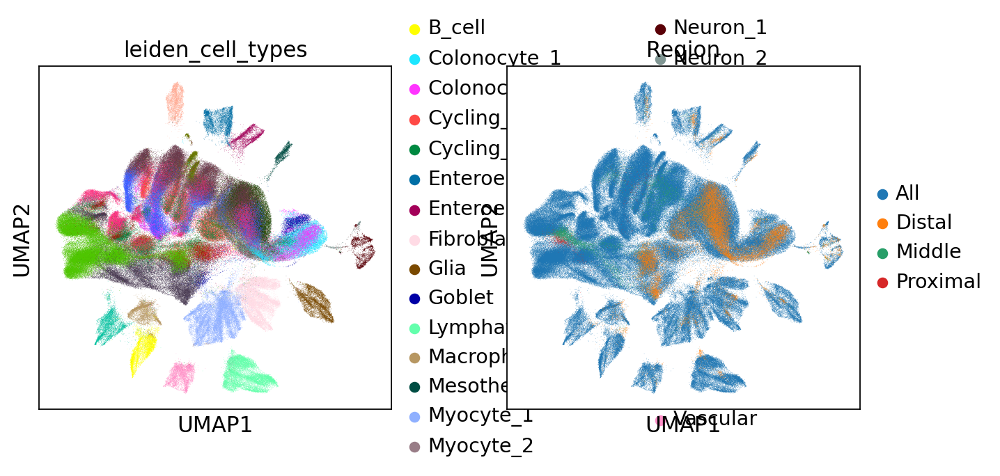

In [33]:
sc.pl.umap(adata_c_integ, color=['leiden_cell_types', 'Region'])

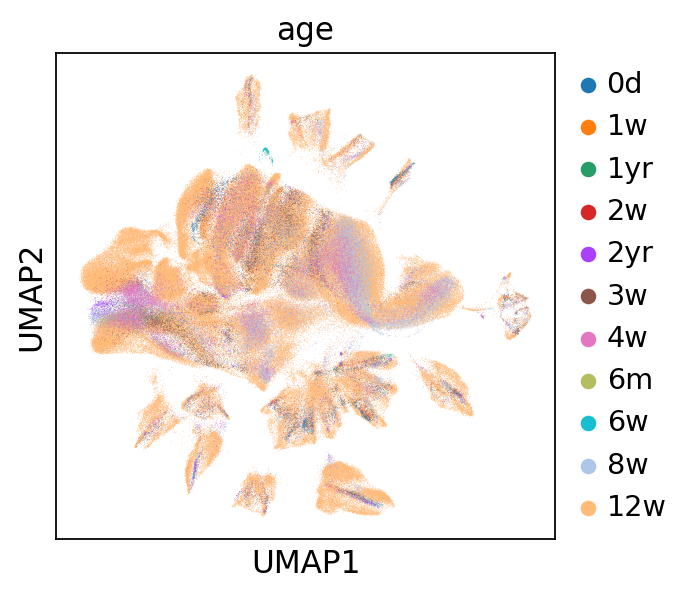

In [28]:
sc.pl.umap(adata_c_integ, color=['age'])

#### Plots total cluster cell proportions

In [13]:
props = get_cluster_proportions(adata_c_integ,
                            cluster_key="leiden_cell_types",
                            sample_key="age",
                            drop_values=None)

/home/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 


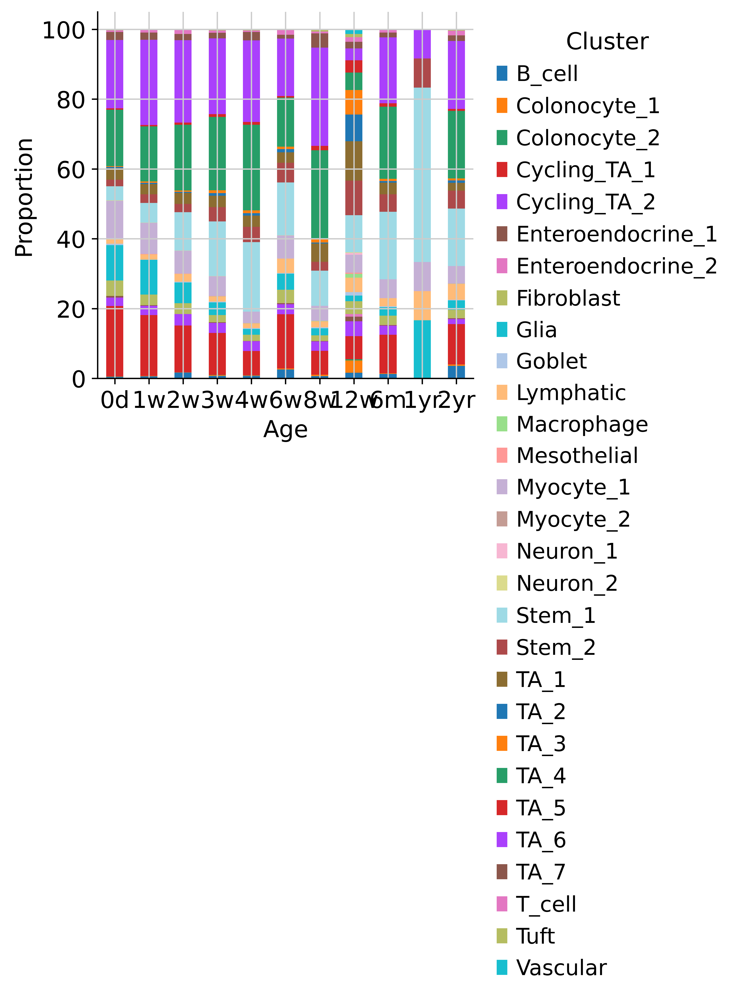

In [14]:
pl = plot_cluster_proportions(props, cluster_palette=None, xlabel_rotation=0, order = ['0d', '1w', '2w', '3w', '4w', '6w', '8w', '12w', '6m', '1yr', '2yr'])

#### Get averages per category

In [52]:
'Gets logged values'
adata_c_integ_mean_log10_scanpy = grouped_obs_mean(adata_c_integ, ['age', 'cell_type'])
adata_c_integ_mean_log10_scanpy.to_csv('integrated_means_by_age_and_ct_log10_scanpy.csv')
adata_c_integ_mean_log10_scanpy = grouped_obs_mean(adata_c_integ, ['cell_type'])
adata_c_integ_mean_log10_scanpy.to_csv('integrated_means_by_age_ct_log10_scanpy.csv')
'Gets only normalized values'
adata_c_integ.X = adata_c_integ.X.astype(float)
adata_c_integ.X = np.exp(adata_c_integ.X - 1)
adata_c_integ_mean_norm_scanpy = grouped_obs_mean(adata_c_integ, ['age', 'cell_type'])
adata_c_integ_mean_norm_scanpy.to_csv('integrated_means_by_age_and_ct_norm_scanpy.csv')
adata_c_integ_mean_norm_scanpy = grouped_obs_mean(adata_c_integ, ['cell_type'])
adata_c_integ_mean_norm_scanpy.to_csv('integrated_means_by_ct_norm_scanpy.csv')

/home/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


/home/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/home/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


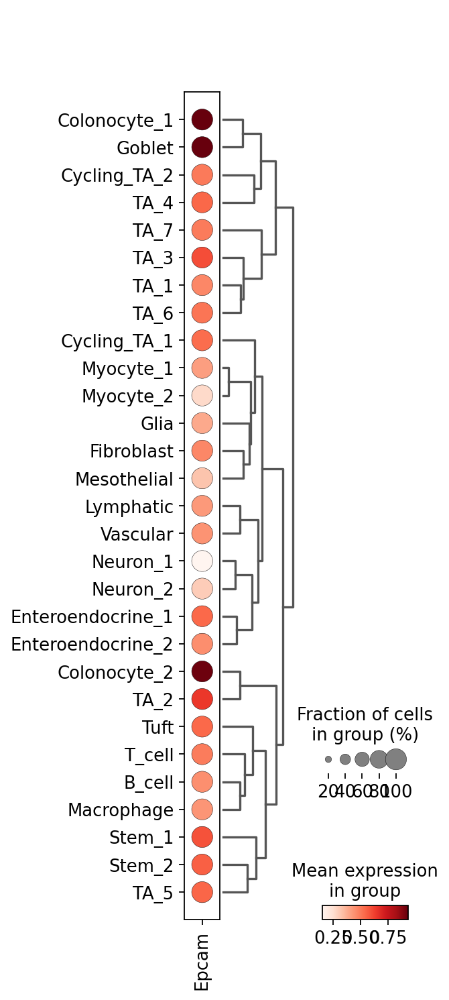

In [53]:
sc.pl.dotplot(adata_c_integ, groupby = ['cell_type'], var_names = ['Epcam'], dendrogram=True)

In [56]:
sc.pl.umap(adata_c_integ, color=['Cd8a', 'S_score'])

/home/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


KeyError: "Could not find entry in `obsm` for 'tsne'.\nAvailable keys are: ['X_harmony', 'X_pca', 'X_umap']."

In [57]:
adata_c_integ

AnnData object with n_obs × n_vars = 360986 × 2064
    obs: 'leiden', 'Unique_ID', 'Sample_ID', 'Mouse_ID', 'Sex', 'cell_type', 'age', 'predicted_doublets', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_Gm', 'log1p_total_counts_Gm', 'pct_counts_Gm', 'S_score', 'G2M_score', 'phase', 'pheno', 'pheno_cell_types', 'leiden_cell_types', 'batch', 'doublet_scores'
    var: 'Gm', 'ribo', 'mt', 'n_cells-12w', 'n_cells_by_counts-12w', 'mean_counts-12w', 'log1p_mean_counts-12w', 'pct_dropout_by_counts-12w', 'total_counts-12w', 'log1p_total_counts-12w', 'mean-12w', 'std-12w', 'n_cells-new', 'n_cells_by_counts-new', 'mean_counts-new', 'log1p_mean_counts-new', 'pct_dropout_by_counts-new', 'total_counts-new', 'log1p_total_counts-new', 'mean-new', 'std-new', 'gene_ids-new', 'feature_types-new'
    uns: 'cell_type

In [269]:
adata_decon_cd45 = adata_concat[(adata_concat.obs.batch == 'new') == True]
adata_decon_cd45.obs['barcodes'] = [i.split("-new")[0] for i in adata_decon_cd45.obs.index]
len(adata_cd45_subset.obs.index) == len(adata_decon_cd45.obs.index)


/Users/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
Trying to set attribute `.obs` of view, copying.


True

In [270]:
# merge the deconvoluted cd45 data back with the tumors and original umap
adata_cd45_subset_final = adata_c_reclus[adata_c_reclus.obs['leiden_final'].str.startswith(("cd4",'dc')) == True]
adata_cd45_subset_final.obs = pd.DataFrame.merge(adata_cd45_subset_final.obs, adata_decon_cd45.obs[['ct_sanja_labels', 'barcodes']], left_index = True, right_on = 'barcodes')
adata_cd45_subset_final.obs.index = [i.split("-new")[0] for i in adata_cd45_subset_final.obs.index]

/Users/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [271]:
adata_concat_marge = adata_cd45_subset_final.concatenate(adata_tumor_subset)

/Users/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'louvain' as categorical
... storing 'leiden' as categorical
... storing 'leiden_final_x' as categorical
... storing 'leiden_final_y' as categorical
... storing 'leiden_final' as categorical
... storing 'ct_sanja_labels' as categorical
... storing 'barcodes' as categorical


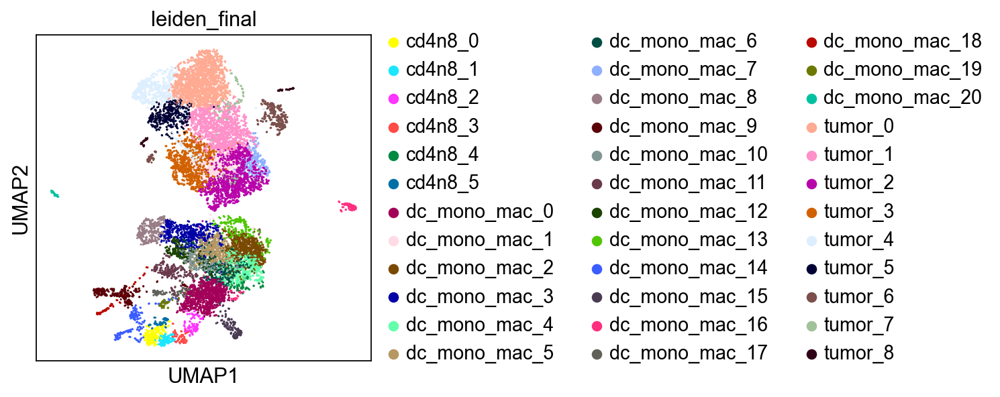

In [272]:
sc.pl.umap(adata_concat_marge, color=['leiden_final'])

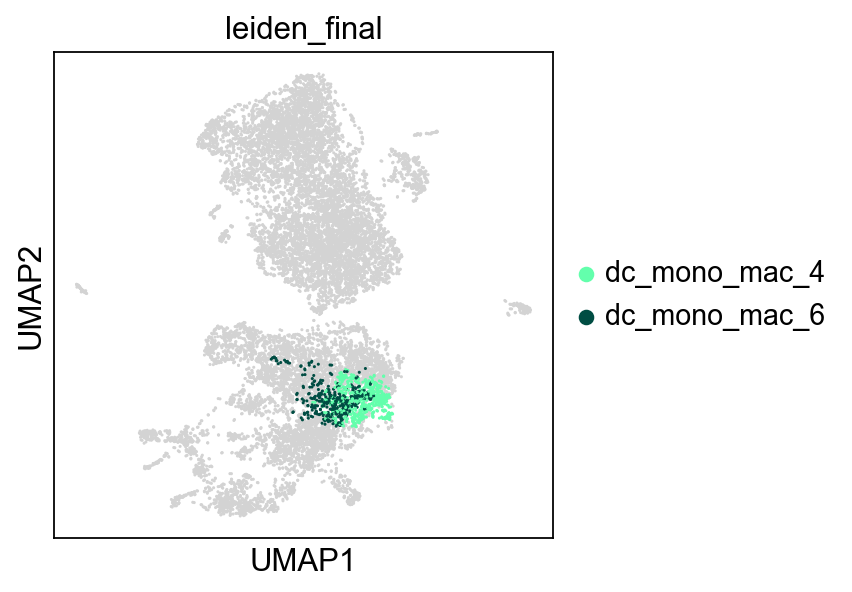

In [396]:
sc.pl.umap(adata_concat_marge, color=['leiden_final'], groups = ['dc_mono_mac_4','dc_mono_mac_6']) #dc_mono_mac_16 cd4n8_6

/Users/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


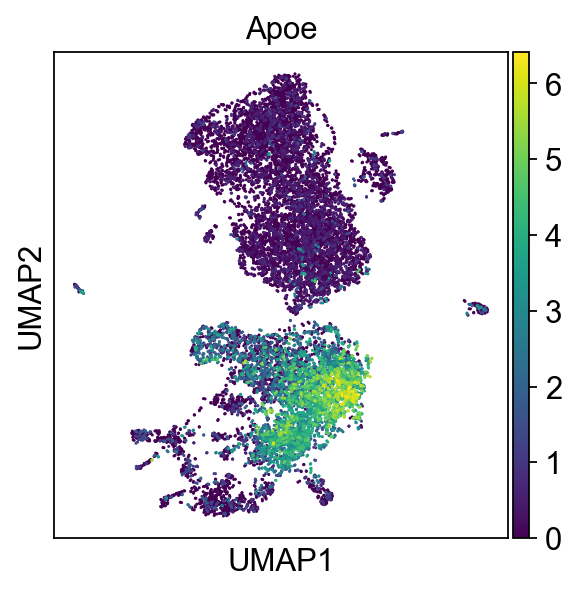

In [398]:
sc.pl.umap(adata_concat_marge, color=['Apoe'], use_raw = True) #Cd209a+Cd86+

In [364]:
adata_concat_marge.raw.var_names[adata_concat_marge.raw.var_names.str.startswith("Gr")]

Index(['Grin1', 'Grb14', 'Grem1', 'Grhpr', 'Grik3', 'Grm3', 'Grk4', 'Grpel1',
       'Grsf1', 'Grm8', 'Grid2', 'Grm7', 'Grcc10', 'Grin2b', 'Grik5',
       'Gramd1a', 'Grwd1', 'Grin2d', 'Grm5', 'Grtp1', 'Gria4', 'Gramd1b',
       'Grik4', 'Gramd2', 'Grm1', 'Grik2', 'Grin3b', 'Grip1', 'Grb10', 'Grap',
       'Grn', 'Grb2', 'Greb1', 'Grhl1', 'Grk6', 'Grid1', 'Grhl2', 'Grina',
       'Grap2', 'Gramd4', 'Grasp', 'Gramd1c', 'Greb1l', 'Gramd3', 'Grpel2',
       'Grk5', 'Gripap1', 'Gria3'],
      dtype='object')

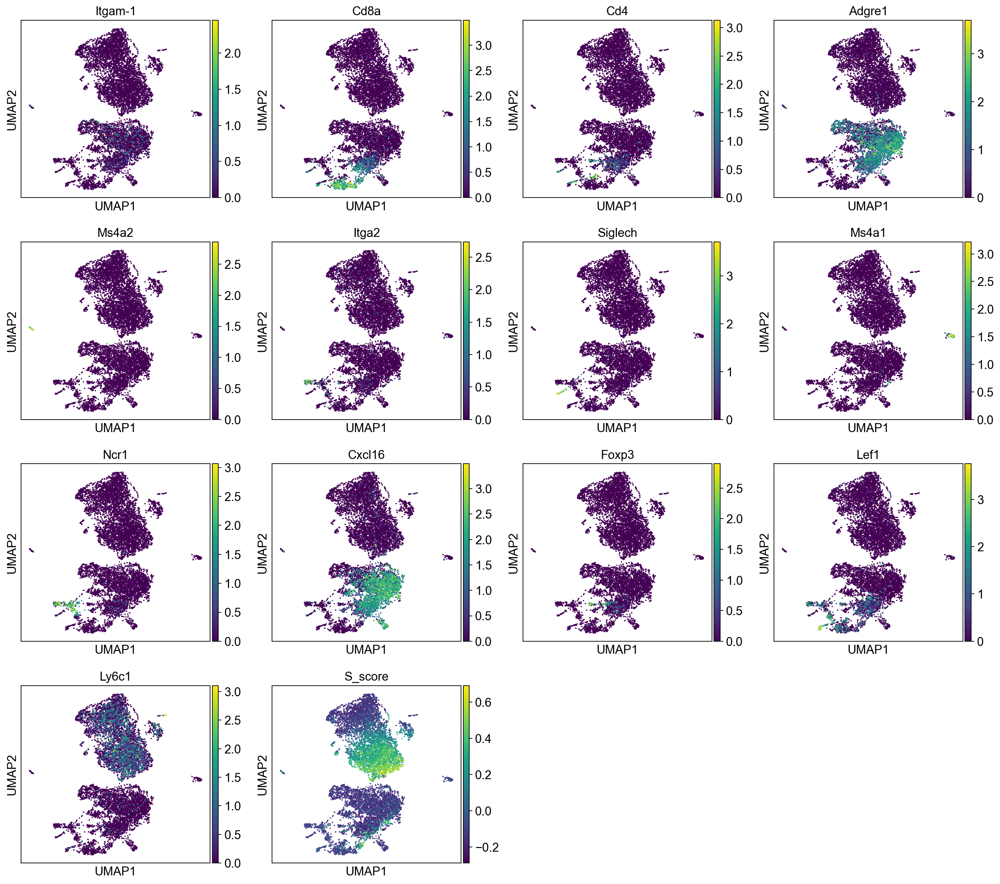

In [276]:
# plot sanity check gene to know how to subcluster; Cd8, Cd4, Macs, Mast, Basophil, DC1, B cell, NK, DC3, Treg, Naive Cd4, Mono, DC2
sc.pl.umap(adata_concat_marge, color=['Cd8a', 'Cd4', 'Adgre1', 'Ms4a2', 'Itga2', 'Siglech', 'Ms4a1', 'Ncr1', 'Cxcl16', 'Foxp3', 'Lef1', 'Ly6c1', 'S_score'], use_raw=True)

In [71]:
# # do cluster renaming to be sure all possible cells make it
# old_to_new = dict(
#     cd4n8_0= 'Exhausted Cd8 cells - 1', #Pdcd1 high
#     cd4n8_1='Exhausted Cd8 cells - 2', 
#     cd4n8_2= 'Proliferative Cd8 cells', 
#     cd4n8_3= 'NKT cells', 
#     cd4n8_4= 'Naive T cells', 
#     cd4n8_5= 'Exhausted Cd4 cells', #Pdcd1 high
#     cd4n8_6= 'Proliferative Cd4 cells',
#     dc_mono_mac_0 = 'Cd74+C1qa+Mafb+Lyz2+ Macrophages',
#     dc_mono_mac_1 = 'M2 Macrophages',
#     dc_mono_mac_2 = 'Cd8+ Macrophages',
#     dc_mono_mac_3 = 'DC3',
#     dc_mono_mac_4 = 'M1 Macrophages',
#     dc_mono_mac_5 = 'Cd209a+Cd86+ DC', 
#     dc_mono_mac_6 = 'NK cells',
#     dc_mono_mac_7 = 'CD52- Macrophages',
#     dc_mono_mac_8 = 'Il7r+ Macrophages',
#     dc_mono_mac_9 = 'mregDC', #maybe? 
#     dc_mono_mac_10 = 'B cells',
#     dc_mono_mac_11 = 'Treg', 
#     dc_mono_mac_12 = 'Lpl+Cd68+ Macrophages',
#     dc_mono_mac_13 = 'Monocytes',
#     dc_mono_mac_14 = 'Mast cells',
#     dc_mono_mac_15 = 'gDT',
#     dc_mono_mac_16 = 'tumor_8',
#     tumor_7 = 'Fibroblasts',
# )

In [399]:
# do cluster renaming to be sure all possible cells make it
old_to_new = dict(
    cd4n8_0= 'Exhausted Cd8 cells - 1',  #cd8 Rac2 high Cxcr3 high Ccl5 high
    cd4n8_1= 'Exhausted Cd8 cells - 2',  #cd8 Rac2 high Cxcr3 low Ccl5 high
    cd4n8_2= 'Proliferating Cd8 cells',  #cd8 S cycle score
    cd4n8_3= 'Exhausted Cd8 cells - 3',  #cd8 Pdcd1 high Cxcr3 low Ccl5 low
    cd4n8_4= 'Monocytes', 
    cd4n8_5= 'Exhausted Cd4 cells',
    dc_mono_mac_0 = 'Cd8+ Macrophages',
    dc_mono_mac_1 = 'tumor_9',
    dc_mono_mac_2 = 'Pf4 Macrophages',
    dc_mono_mac_3 = 'Dmkn Macrophages', #Cxcl16-
    dc_mono_mac_4 = 'Apoe Macrophages',
    dc_mono_mac_5 = 'M1 Macrophages', 
    dc_mono_mac_6 = 'M2 Macrophages', # more sure these should be separated from dc_mono_mac_4
    dc_mono_mac_7 = 'tumor_10',
    dc_mono_mac_8 = 'Tyrobp Macrophages', # Fcgr4- Tyrobp high Plac8 high
    dc_mono_mac_9 = 'NK cells',
    dc_mono_mac_10 = 'CD52- Macrophages',
    dc_mono_mac_11 = 'Cd209a+Cd86+ DC', 
    dc_mono_mac_12 = 'Cxcl5 Macrophages',
    dc_mono_mac_13 = 'Apoptotic macrophages', #Rhov high
    dc_mono_mac_14 = 'Naive Cd4 T cells',
    dc_mono_mac_15 = 'DC3',
    dc_mono_mac_16 = 'B cells',
    dc_mono_mac_17 = 'Treg',
    dc_mono_mac_18 = 'pDC',
    dc_mono_mac_19 = 'M1 Macrophages',
    dc_mono_mac_20 = 'Mast',
    tumor_8 = 'Fibroblasts',
)

In [400]:
adata_concat_marge.obs['final_ct_sanja_labels'] = adata_concat_marge.obs['leiden_final'].replace(old_to_new)

... storing 'final_ct_sanja_labels' as categorical


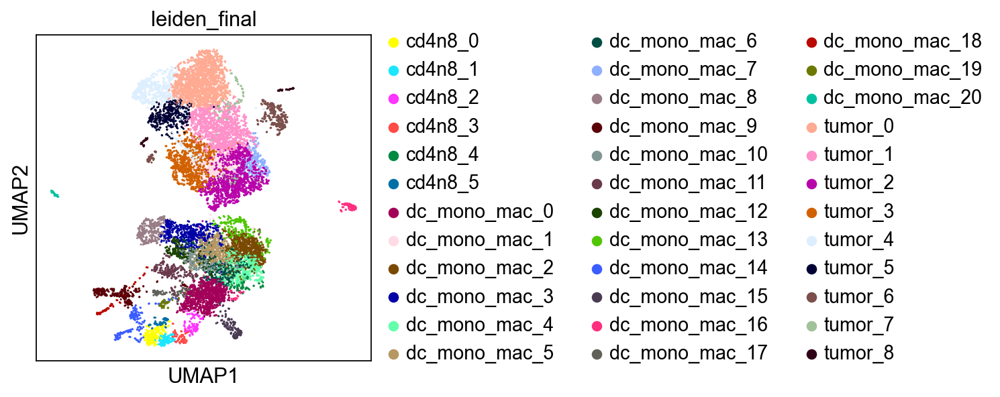

In [401]:
sc.pl.umap(adata_concat_marge, color=['leiden_final'])

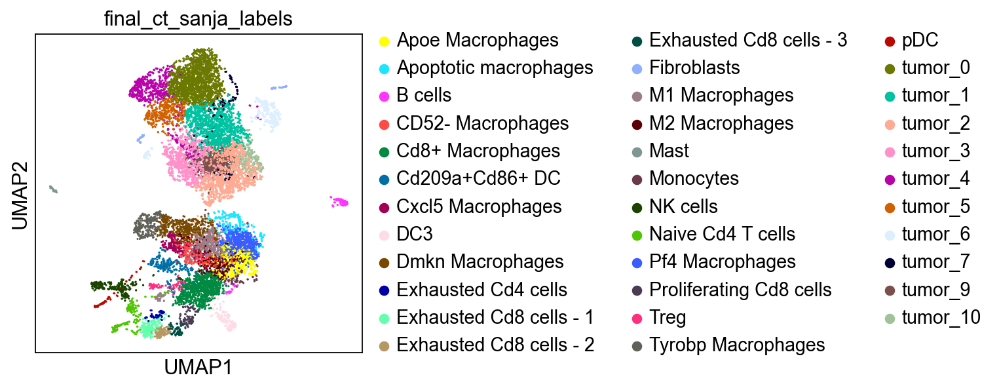

In [402]:
sc.pl.umap(adata_concat_marge, color=['final_ct_sanja_labels'])

## Finding marker genes

Let us compute a ranking for the highly differential genes in each cluster. For this, by default, the `.raw` attribute of AnnData is used in case it has been initialized before. The simplest and fastest method to do so is the w-test.

/Users/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:408: RuntimeWarning: invalid value encountered in log2
  foldchanges[global_indices]


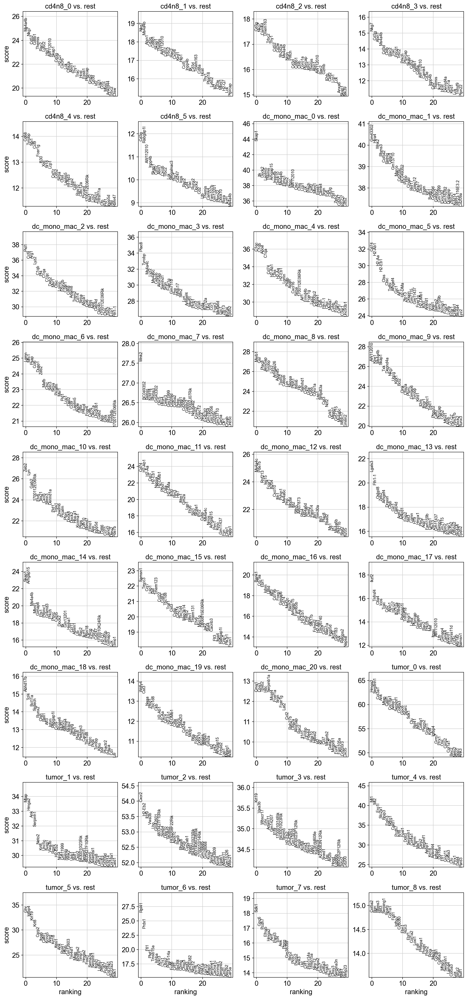

In [419]:
sc.tl.rank_genes_groups(adata_concat_marge, 'leiden_final', method='wilcoxon', use_raw = False)
sc.pl.rank_genes_groups(adata_concat_marge, n_genes=30, sharey=False)

# The following code helps with assigning annotations to clusters

/Users/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
Trying to set attribute `.var` of view, copying.


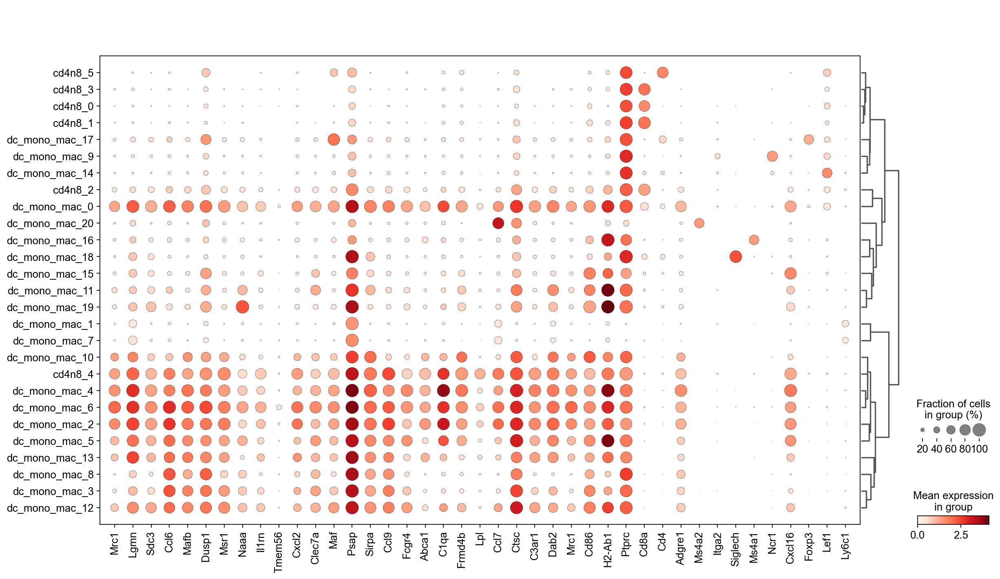

In [404]:
# list top 10 genes in a cluster + some marker genes
cl_name = 'dc_mono_mac_6'#dc_mono_mac_16
tmpdf = adata_cd45_subset_final[adata_cd45_subset_final.obs['leiden_final'] == cl_name]
tmpdf.var['total_expression'] = tmpdf.X.sum(0)
top = tmpdf.var['total_expression'].nlargest(25)

sc.pl.dotplot(adata_cd45_subset_final,top.index.tolist()+ ['Mrc1','Cd86','H2-Ab1',  'Ptprc', 'Cd8a', 'Cd4', 'Adgre1', 'Ms4a2', 'Itga2', 'Siglech', 'Ms4a1', 'Ncr1', 'Cxcl16', 'Foxp3', 'Lef1', 'Ly6c1'], 
              use_raw = True, groupby = 'leiden_final', dendrogram=True)


In [405]:
# check dot plot against known markers
genes_markers = pd.DataFrame(pd.read_excel(os.path.join('data/markers/Markers_Mouse.xlsx')))
genes_tils = pd.DataFrame(pd.read_excel(os.path.join('data/markers/TILs_Mouse.xlsx')))
genes_all = pd.concat([genes_markers, genes_tils], axis=1, sort=False)

# makes sure all marker genes are in the dataset
markers_dict = dict()
flatten = lambda t: [item for sublist in t for item in sublist]
def intersection(lst1, lst2): 
    return list(set(lst1) & set(lst2)) 
genes_inters = intersection(np.unique(np.array(flatten([v.dropna().tolist() for i,v in genes_all.iteritems()]))).tolist(), adata_concat_marge.raw.var_names.tolist())

for cell_type in genes_all.columns:
    tmp_genes = intersection(genes_all[cell_type].dropna().tolist(),genes_inters)
    markers_dict[cell_type] = tmp_genes

/Users/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


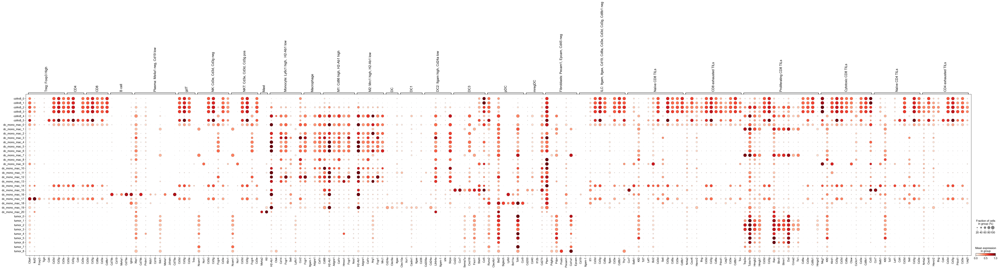

In [406]:
sc.pl.dotplot(adata_concat_marge, markers_dict, groupby='leiden_final', standard_scale = 'group', use_raw = True);

/Users/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


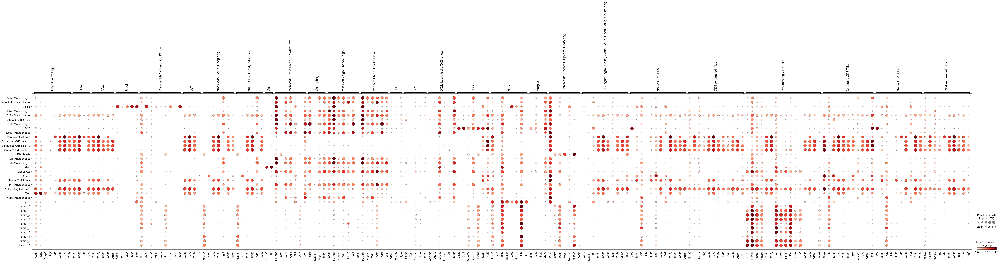

In [407]:
sc.pl.dotplot(adata_concat_marge, markers_dict, groupby='final_ct_sanja_labels', standard_scale = 'group');

Show the 10 top ranked genes per cluster 0, 1, ..., 7 in a dataframe.

In [420]:
markers_clusters = pd.DataFrame(adata_concat_marge.uns['rank_genes_groups']['names']).head(3)

In [421]:
markers_clusters_dict = dict()
for i in markers_clusters.columns:
    markers_clusters_dict[i] = markers_clusters[i].tolist()

Get a table with the scores and groups.

In [422]:
# result = adata_concat_marge.uns['rank_genes_groups']
# groups = result['names'].dtype.names
# pd.DataFrame(
#     {group + '_' + key[:1]: result[key][group]
#     for group in groups for key in ['names', 'pvals']}).head(3)

,cd4n8_0_n,cd4n8_0_p,cd4n8_1_n,cd4n8_1_p,cd4n8_2_n,cd4n8_2_p,cd4n8_3_n,cd4n8_3_p,cd4n8_4_n,cd4n8_4_p,...,tumor_4_n,tumor_4_p,tumor_5_n,tumor_5_p,tumor_6_n,tumor_6_p,tumor_7_n,tumor_7_p,tumor_8_n,tumor_8_p
0,Ms4a4b,1.561392e-135,Nkg7,4.110153e-77,Cd3g,9.396141e-69,Nkg7,9.399874e-52,Cd68,2.089798e-43,...,Mt1,0.0,Ghr,3.561991e-247,Rpl41,5.340905e-155,Sdk1,4.643412e-73,Col5a2,5.807381e-50
1,Nkg7,2.024191e-131,Ms4a4b,1.653247e-75,Nkg7,1.254323e-68,Cd3g,4.337067e-48,Tyrobp,1.556917e-42,...,Mt2,0.0,Igfbp4,8.694875e-236,Prdx1,2.217468e-124,Gpc6,4.226184e-66,Bgn,5.883511e-50
2,Cd52,5.048563e-124,Atxn1,3.108513e-71,Camk4,1.235556e-67,Atxn1,2.718074e-47,Spi1,2.191335e-42,...,Ero1l,0.0,Krt19,6.204813e-225,Ftl1,1.890309e-87,Pcdh7,1.973441e-64,Rbms3,5.901568e-50


/Users/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


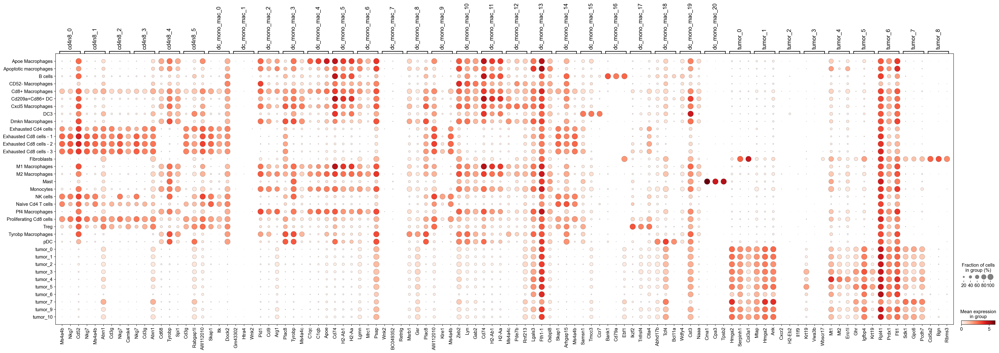

In [424]:
sc.pl.dotplot(adata_concat_marge, markers_clusters_dict, groupby='final_ct_sanja_labels', use_raw = True); # plots by 3 top ranked genes

In [428]:
#adata_concat_marge.write_h5ad(filename = 'data/h5ad/Giulia_3X_sanja_new.h5ad')


/Users/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


In [429]:
#adata_concat_marge.raw.to_adata().write('data/h5ad/Giulia_3X_sanja_raw_new.h5ad')

If you want to export to "csv", you have the following options:

In [87]:
# Export single fields of the annotation of observations
# adata.obs[['n_counts', 'louvain_groups']].to_csv(
#     './write/pbmc3k_corrected_louvain_groups.csv')

# Export single columns of the multidimensional annotation
# adata.obsm.to_df()[['X_pca1', 'X_pca2']].to_csv(
#     './write/pbmc3k_corrected_X_pca.csv')

# Or export everything except the data using `.write_csvs`.
# Set `skip_data=False` if you also want to export the data.
# adata.write_csvs(results_file[:-5], )